## 1) Run Once — Imports
Purpose: Import necessary libraries for data loading, EDA, cleaning, and visualization. We use pandas for data manipulation, numpy for numerical ops, matplotlib/seaborn for plots, and sklearn for some preprocessing utils. Added plotly for interactive visualizations to enhance exploration

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px  
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
%matplotlib inline 
sns.set(style="whitegrid")  

UsageError: unrecognized arguments: # For inline plots in Jupyter


## 2) Load the Data
Purpose: Read the Excel file into a DataFrame. Confirm shape, columns, and a quick peek at the target variable (Deficiency_Status) to understand class distribution. Visualize column types as a bar plot for overview. In a company setting, I'd log this step for reproducibility and check if the data source is secure/complian

Dataset Shape: (50000, 8)
Columns: ['Age', 'BMI', 'Sun_Exposure_Hours_Per_Week', 'Physical_Activity_Level', 'Vitamin_D_Intake_mcg_Per_Day', 'Latitude', 'Risk_Score', 'Deficiency_Status']

Target Distribution:
 Deficiency_Status
Deficient    71.146
Normal       28.854
Name: proportion, dtype: float64


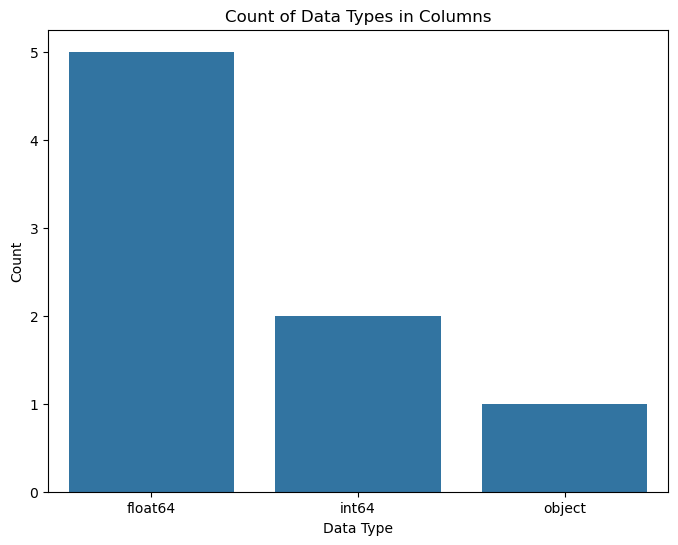

In [ ]:
df = pd.read_excel("Enhanced_Vitamin_D_Deficiency_Prediction.xlsx")
print("Dataset Shape:", df.shape)
print("Columns:", df.columns.tolist())
print("\nTarget Distribution:\n", df['Deficiency_Status'].value_counts(normalize=True) * 100)  
df.head()  

# Visualization: Bar plot of data types count
dtype_counts = df.dtypes.value_counts()
plt.figure(figsize=(8, 6))
sns.barplot(x=dtype_counts.index, y=dtype_counts.values)
plt.title("Count of Data Types in Columns")
plt.xlabel("Data Type")
plt.ylabel("Count")
plt.show()

## 3) Dataset Overview
Purpose: Get info on data types, non-null counts, and memory usage. This helps identify if columns are correctly typed (e.g., Age as. Visualize non-null percentages as a bar plot. In healthcare, ensure no sensitive PII is exposed.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 8 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Age                           50000 non-null  int64  
 1   BMI                           50000 non-null  float64
 2   Sun_Exposure_Hours_Per_Week   50000 non-null  float64
 3   Physical_Activity_Level       50000 non-null  int64  
 4   Vitamin_D_Intake_mcg_Per_Day  50000 non-null  float64
 5   Latitude                      50000 non-null  float64
 6   Risk_Score                    50000 non-null  float64
 7   Deficiency_Status             50000 non-null  object 
dtypes: float64(5), int64(2), object(1)
memory usage: 3.1+ MB


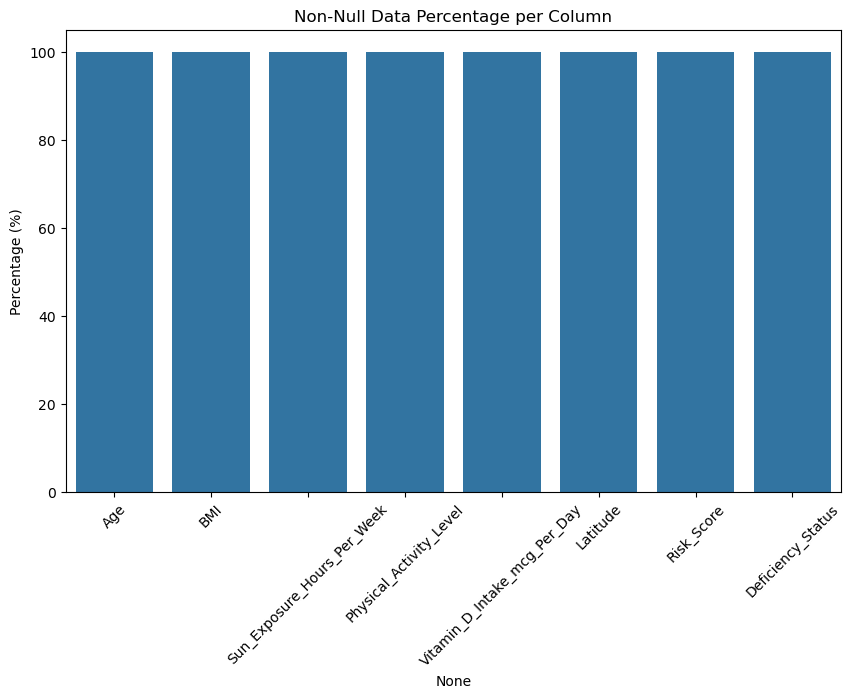

In [ ]:
df.info()
df.describe(include='all')  

# Visualization: Bar plot of non-null percentages
non_null_perc = (df.notnull().sum() / len(df)) * 100
plt.figure(figsize=(10, 6))
sns.barplot(x=non_null_perc.index, y=non_null_perc.values)
plt.xticks(rotation=45)
plt.title("Non-Null Data Percentage per Column")
plt.ylabel("Percentage (%)")
plt.show()

## 4) Missing Data Analysis
Purpose: Count missing values per column and visualize. In healthcare datasets, missingness might indicate tests not performed (e.g., Vitamin D intake not recorded). If >50% missing in a column, consider dropping; else, impute later. Patterns: Check if missing correlates with target. Added pie chart for overall missing proportion.

Missing Values:
 Series([], dtype: int64)


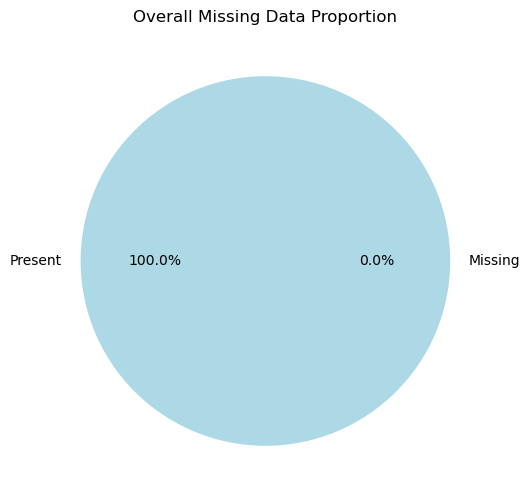

In [ ]:
missing = df.isnull().sum()
print("Missing Values:\n", missing[missing > 0]) 

# Visualization 1: Pie chart for overall missing vs non-missing
total_cells = df.shape[0] * df.shape[1]
missing_total = missing.sum()
plt.figure(figsize=(6, 6))
plt.pie([missing_total, total_cells - missing_total], labels=['Missing', 'Present'], autopct='%1.1f%%', colors=['orange', 'lightblue'])
plt.title("Overall Missing Data Proportion")
plt.show()

# Check missing by target (if any missing)
if missing.sum() > 0:
    for col in df.columns:
        if df[col].isnull().sum() > 0:
            print(f"\nMissing in {col} by Deficiency_Status:\n", df.groupby('Deficiency_Status')[col].apply(lambda x: x.isnull().sum()))
            # Visualization: Stacked bar for missing by target
            missing_by_target = df.groupby('Deficiency_Status')[col].apply(lambda x: x.isnull().sum()).reset_index(name='Missing')
            sns.barplot(x='Deficiency_Status', y='Missing', data=missing_by_target)
            plt.title(f"Missing in {col} by Target")
            plt.show()

## 5) Descriptive Statistics
Purpose: Get mean, median, etc., for numerical features and frequencies for categorical. Compare stats grouped by target to spot differences (e.g., lower sun exposure in Deficient group?). Visualize numerical stats as boxplots and categorical as bar plots. In company work, I'd document clinical ranges (e.g., BMI >30 = obese, relevant for vitamin D).

Numerical Descriptive Stats:
                 Age           BMI  Sun_Exposure_Hours_Per_Week  \
count  50000.000000  50000.000000                 50000.000000   
mean      48.618220     29.212786                     9.998951   
std       17.830761      6.195171                     5.760314   
min       18.000000     18.500082                     0.000082   
25%       33.000000     23.847357                     5.006868   
50%       49.000000     29.181602                     9.970215   
75%       64.000000     34.605247                    14.985172   
max       79.000000     39.999432                    19.999720   

       Physical_Activity_Level  Vitamin_D_Intake_mcg_Per_Day      Latitude  \
count             50000.000000                  50000.000000  50000.000000   
mean                  2.001200                     12.489811     -0.277494   
std                   0.814894                      7.247251     51.880410   
min                   1.000000                      0.000183   

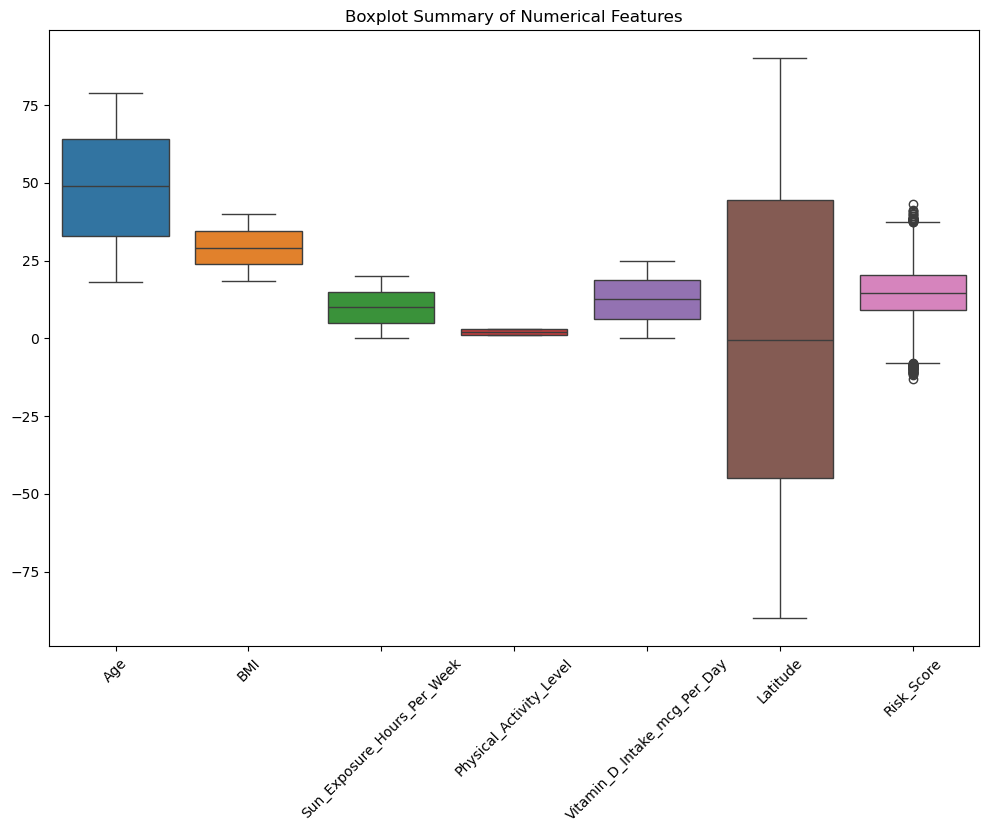


Physical_Activity_Level Value Counts:
 Physical_Activity_Level
2    16798
3    16631
1    16571
Name: count, dtype: int64


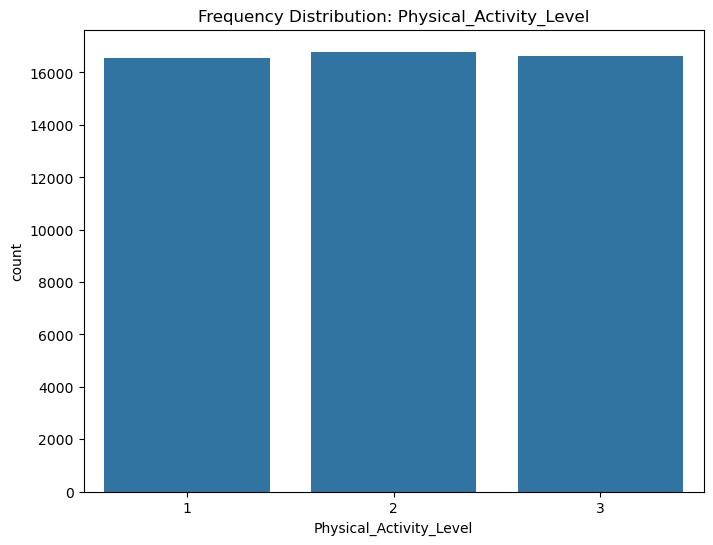


Deficiency_Status Value Counts:
 Deficiency_Status
Deficient    35573
Normal       14427
Name: count, dtype: int64


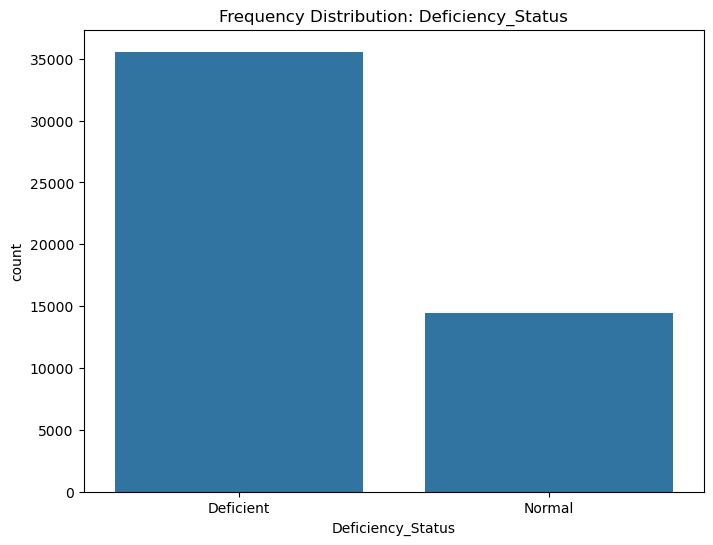


Grouped Stats by Target:
                        Age                                                \
                     count       mean        std   min   25%   50%   75%   
Deficiency_Status                                                          
Deficient          35573.0  52.386866  17.217845  18.0  39.0  54.0  67.0   
Normal             14427.0  39.325778  15.797175  18.0  26.0  37.0  50.0   

                             BMI             ...   Latitude             \
                    max    count       mean  ...        75%        max   
Deficiency_Status                            ...                         
Deficient          79.0  35573.0  30.349166  ...  56.727786  89.999999   
Normal             79.0  14427.0  26.410787  ... -17.755594  89.329202   

                  Risk_Score                                             \
                       count       mean       std        min        25%   
Deficiency_Status                                                      

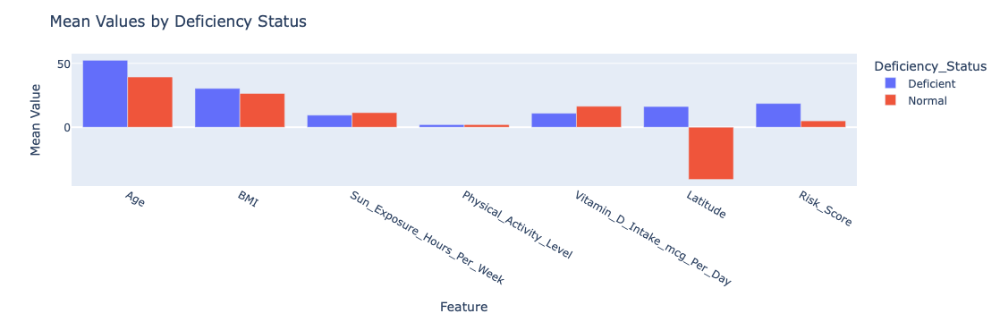

In [ ]:
# Identify numerical columns
num_cols = df.select_dtypes(include=['number']).columns.tolist()


# Numerical stats
num_stats = df.describe()
print("Numerical Descriptive Stats:\n", num_stats)

# Visualization: Boxplot summary for numerical stats
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[num_cols])
plt.title("Boxplot Summary of Numerical Features")
plt.xticks(rotation=45)
plt.show()

# Categorical stats (Deficiency_Status is main cat; Physical_Activity_Level might be ordinal)
cat_cols = ['Physical_Activity_Level', 'Deficiency_Status']  
for col in cat_cols:
    print(f"\n{col} Value Counts:\n", df[col].value_counts())
    # Visualization: Bar plot for frequencies
    plt.figure(figsize=(8, 6))
    sns.countplot(x=col, data=df)
    plt.title(f"Frequency Distribution: {col}")
    plt.show()

# Grouped stats by target
grouped = df.groupby('Deficiency_Status').describe()
print("\nGrouped Stats by Target:\n", grouped)

# Visualization: Interactive bar plot for grouped means using plotly
grouped_means = df.groupby('Deficiency_Status')[num_cols].mean().reset_index()
fig = px.bar(grouped_means.melt(id_vars='Deficiency_Status'), x='variable', y='value', color='Deficiency_Status', barmode='group')
fig.update_layout(title="Mean Values by Deficiency Status", xaxis_title="Feature", yaxis_title="Mean Value")
fig.show()

## 6) Class Balance
Purpose: Check imbalance in target. Vitamin D deficiency is common (~71% Deficient from initial load), so imbalance handling (e.g., SMOTE) might be needed later. Visualize with pie chart and bar plot for reports.

Class Balance (%):
 Deficiency_Status
Deficient    71.146
Normal       28.854
Name: proportion, dtype: float64


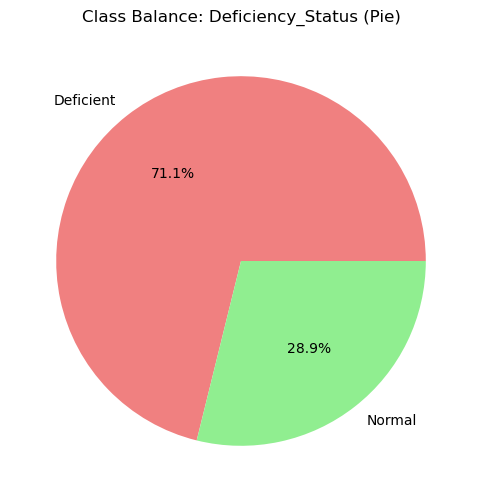

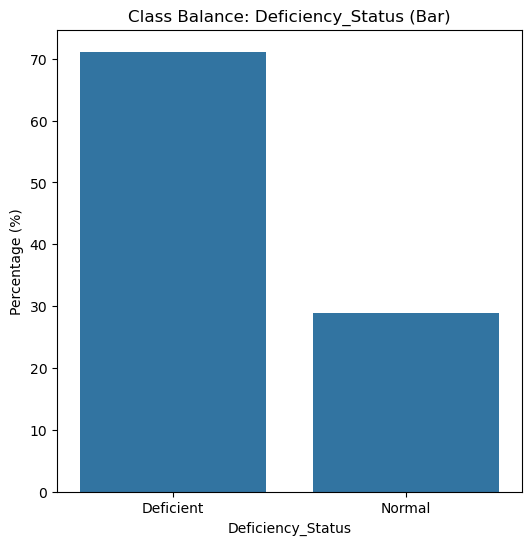

In [13]:
class_balance = df['Deficiency_Status'].value_counts(normalize=True) * 100
print("Class Balance (%):\n", class_balance)

# Visualization 1: Pie chart
plt.figure(figsize=(6, 6))
plt.pie(class_balance, labels=class_balance.index, autopct='%1.1f%%', colors=['lightcoral', 'lightgreen'])
plt.title("Class Balance: Deficiency_Status (Pie)")
plt.show()

# Visualization 2: Bar plot
plt.figure(figsize=(6, 6))
sns.barplot(x=class_balance.index, y=class_balance.values)
plt.title("Class Balance: Deficiency_Status (Bar)")
plt.ylabel("Percentage (%)")
plt.show()

## 7) Outlier Detection
Purpose: Use boxplots and IQR to detect outliers. In healthcare, outliers might be valid (e.g., extreme Latitude for polar regions) or errors (e.g., negative Age). Flag biologically impossible values (e.g., BMI <10 or >60, Sun_Exposure >168 hours/week). Added scatter plot for outlier context.

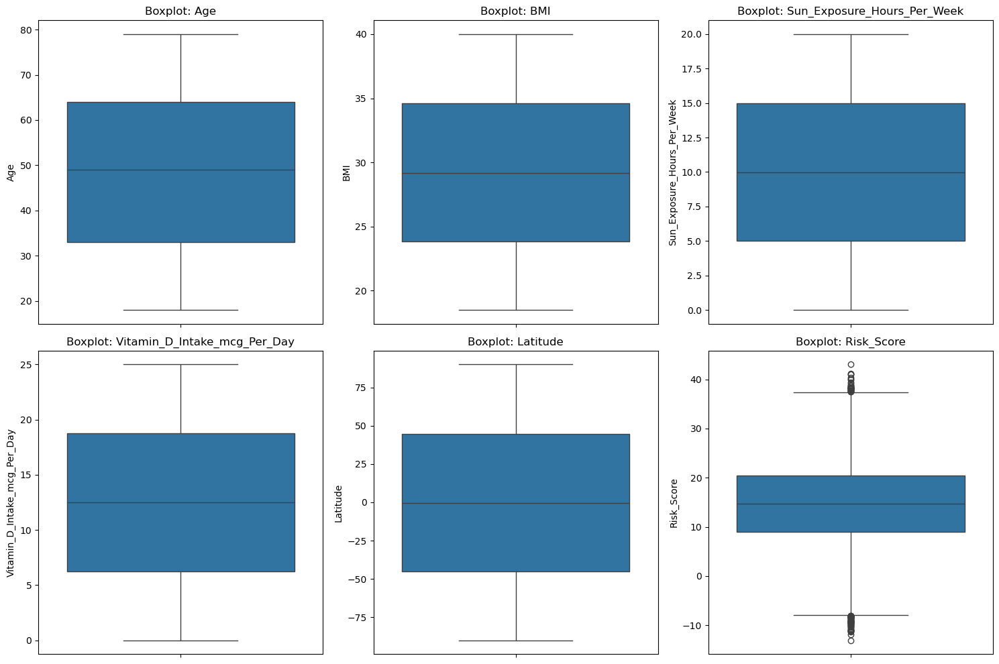

Outliers Count:
 {'Age': 0, 'BMI': 0, 'Sun_Exposure_Hours_Per_Week': 0, 'Vitamin_D_Intake_mcg_Per_Day': 0, 'Latitude': 0, 'Risk_Score': 85}


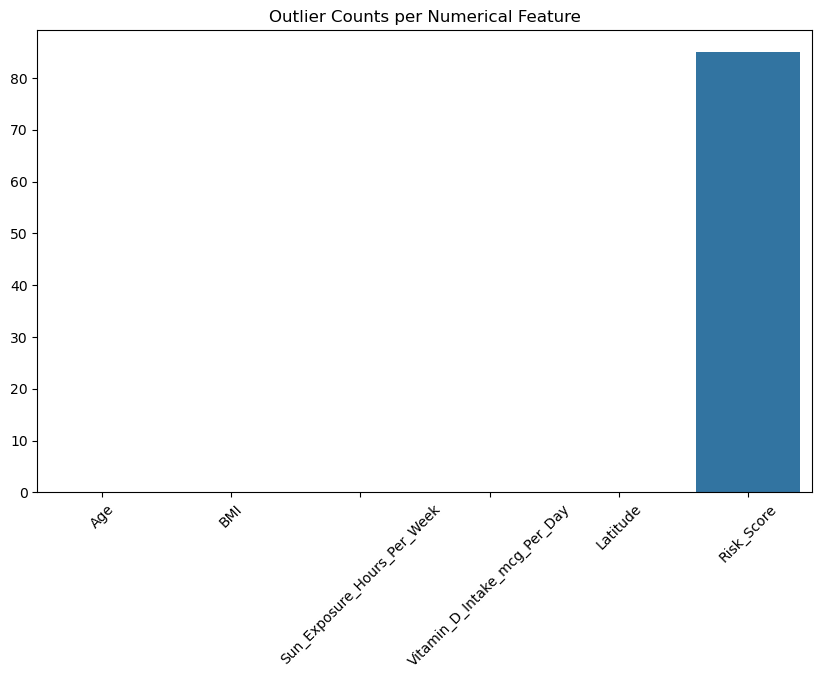

Invalid Values:
 {'Age <0 or >120': 0, 'BMI <10 or >60': 0, 'Sun_Exposure <0 or >168': 0, 'Vitamin_D_Intake <0': 0, 'Latitude <-90 or >90': 0}


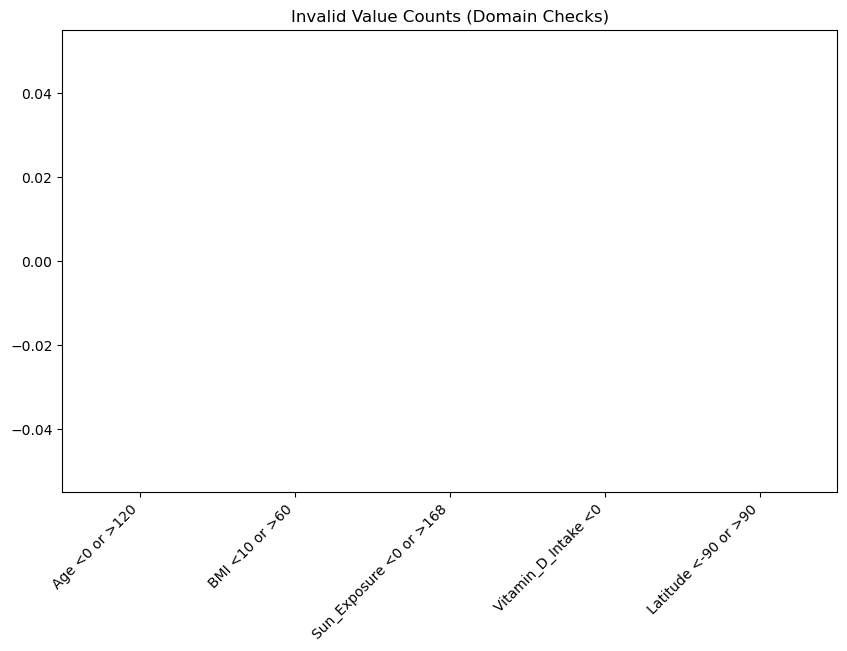

In [ ]:
num_cols = ['Age', 'BMI', 'Sun_Exposure_Hours_Per_Week', 'Vitamin_D_Intake_mcg_Per_Day', 'Latitude', 'Risk_Score']  

# Boxplots for outliers
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(y=df[col])
    plt.title(f"Boxplot: {col}")
plt.tight_layout()
plt.show()

# IQR-based outlier count
def count_outliers(col):
    Q1, Q3 = df[col].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5*IQR, Q3 + 1.5*IQR
    return ((df[col] < lower) | (df[col] > upper)).sum()

outliers = {col: count_outliers(col) for col in num_cols}
print("Outliers Count:\n", outliers)

# Visualization: Bar plot of outlier counts
plt.figure(figsize=(10, 6))
sns.barplot(x=list(outliers.keys()), y=list(outliers.values()))
plt.title("Outlier Counts per Numerical Feature")
plt.xticks(rotation=45)
plt.show()

# Domain checks (healthcare-specific)
invalid = {
    'Age <0 or >120': (df['Age'] < 0) | (df['Age'] > 120),
    'BMI <10 or >60': (df['BMI'] < 10) | (df['BMI'] > 60),
    'Sun_Exposure <0 or >168': (df['Sun_Exposure_Hours_Per_Week'] < 0) | (df['Sun_Exposure_Hours_Per_Week'] > 168),
    'Vitamin_D_Intake <0': df['Vitamin_D_Intake_mcg_Per_Day'] < 0,
    'Latitude <-90 or >90': (df['Latitude'] < -90) | (df['Latitude'] > 90)
}
invalid_counts = {k: v.sum() for k, v in invalid.items()}
print("Invalid Values:\n", invalid_counts)

# Visualization: Bar plot for invalid counts
plt.figure(figsize=(10, 6))
sns.barplot(x=list(invalid_counts.keys()), y=list(invalid_counts.values()))
plt.title("Invalid Value Counts (Domain Checks)")
plt.xticks(rotation=45, ha='right')
plt.show()

## 8) Data Consistency Checks
Purpose: Check duplicates, unique values, and consistency. In healthcare, duplicates might be repeat patients—investigate IDs if available. Standardize strings (e.g., 'Deficient' vs 'deficient'). Visualize duplicates proportion and unique counts.

Duplicates: 0


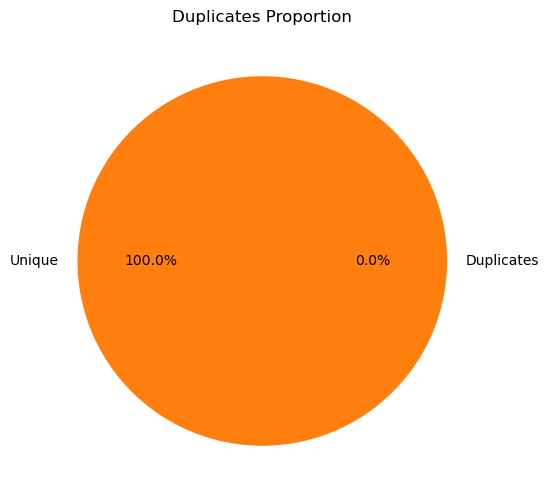


Unique in Physical_Activity_Level: [2 3 1]


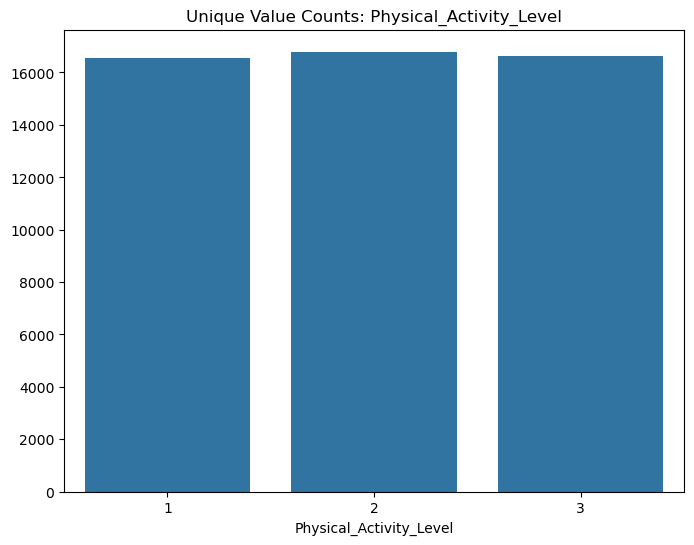


Unique in Deficiency_Status: ['Deficient' 'Normal']


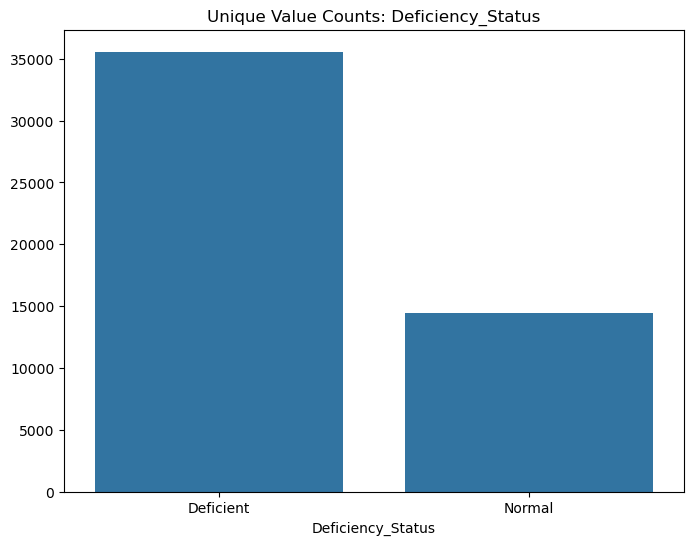

In [15]:
print("Duplicates:", df.duplicated().sum())

# Visualization: Pie chart for duplicates proportion
dup_count = df.duplicated().sum()
plt.figure(figsize=(6, 6))
plt.pie([dup_count, len(df) - dup_count], labels=['Duplicates', 'Unique'], autopct='%1.1f%%')
plt.title("Duplicates Proportion")
plt.show()

# Drop duplicates if any
df = df.drop_duplicates()

# Unique values for categorical/ordinal
for col in cat_cols:
    print(f"\nUnique in {col}:", df[col].unique())
    # Visualization: Bar plot for unique value counts (if many uniques, but here few)
    unique_counts = df[col].value_counts()
    plt.figure(figsize=(8, 6))
    sns.barplot(x=unique_counts.index, y=unique_counts.values)
    plt.title(f"Unique Value Counts: {col}")
    plt.show()

# Strip whitespace in object columns
obj_cols = df.select_dtypes(include='object').columns
for col in obj_cols:
    df[col] = df[col].str.strip()

## 9) Relationships Between Variables
Purpose: Correlation heatmap for numerical features. Check associations with target (e.g., lower Vitamin D intake correlates with deficiency?). Added pairplot for pairwise relationships. In company, I'd note multicollinearity risks for modeling.

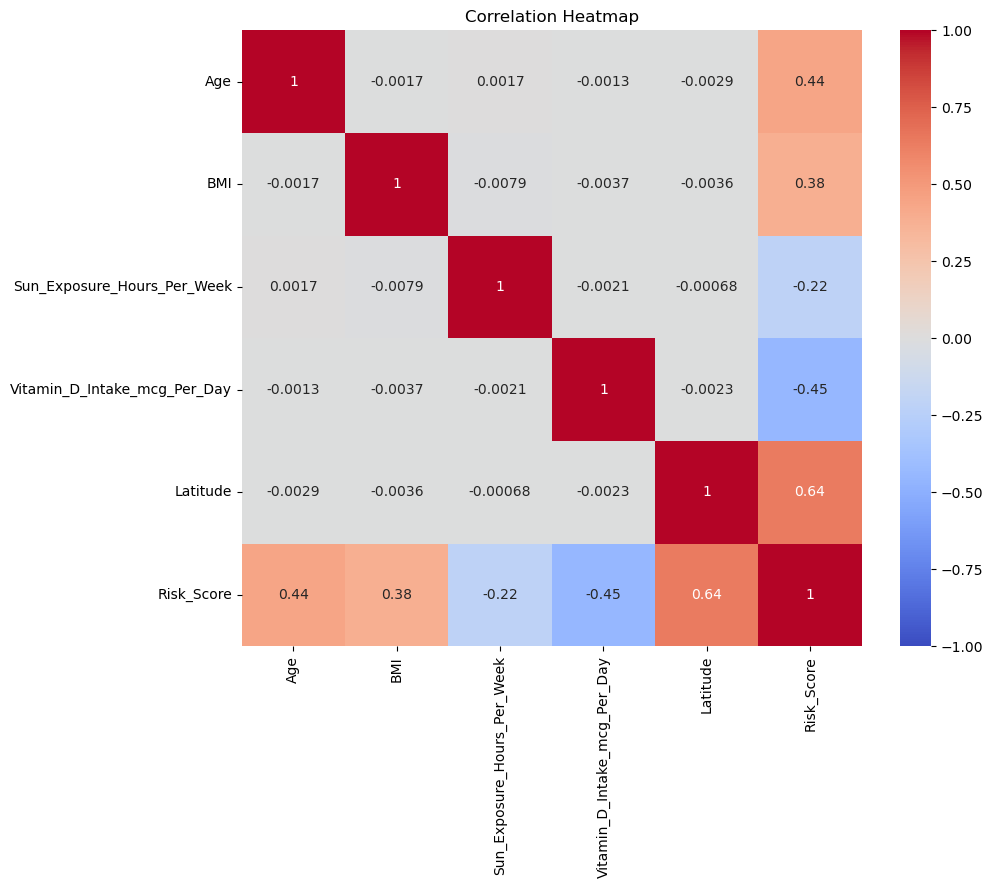

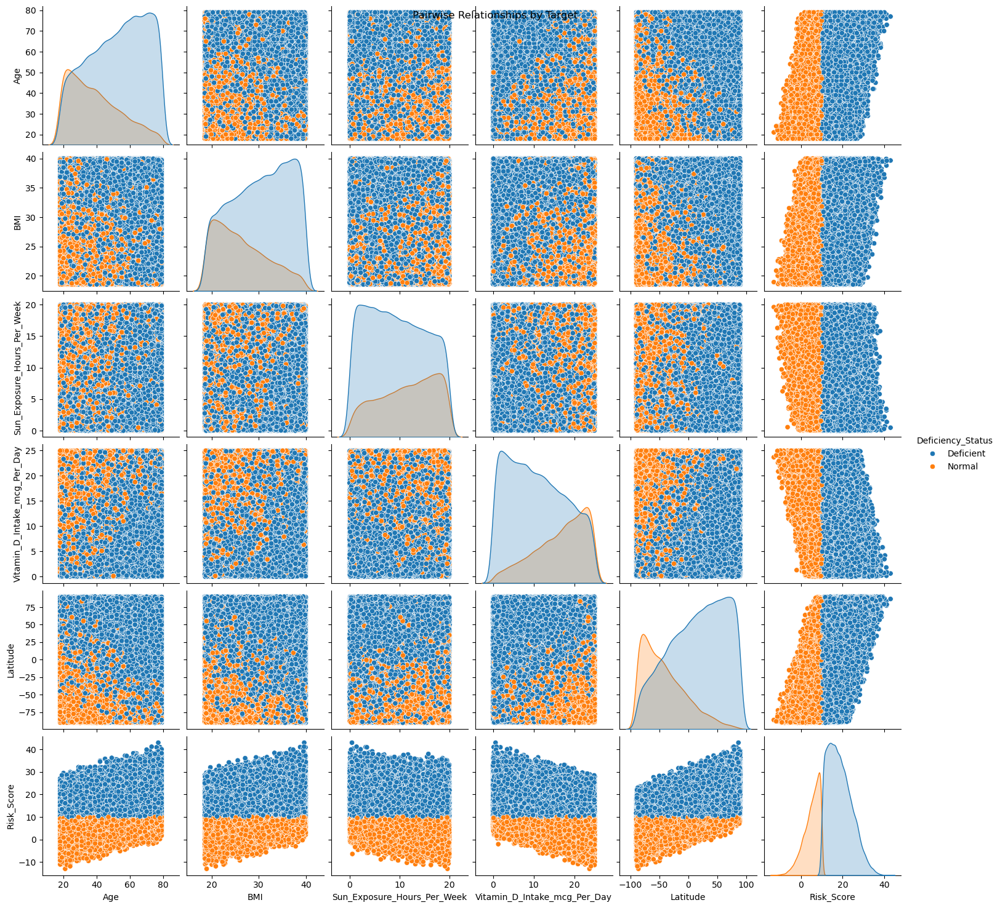


Mean by Deficiency_Status:
                          Age        BMI  Sun_Exposure_Hours_Per_Week  \
Deficiency_Status                                                      
Deficient          52.386866  30.349166                     9.429751   
Normal             39.325778  26.410787                    11.402443   

                   Vitamin_D_Intake_mcg_Per_Day   Latitude  Risk_Score  
Deficiency_Status                                                       
Deficient                             10.914279  16.182660   18.584882  
Normal                                16.374638 -40.863688    4.973508  


In [16]:
# Correlation matrix (exclude target for now)
corr = df[num_cols].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Heatmap")
plt.show()

# Visualization: Pairplot for pairwise relationships
sns.pairplot(df[num_cols + ['Deficiency_Status']], hue='Deficiency_Status')
plt.suptitle("Pairwise Relationships by Target")
plt.show()

# Grouped means by target
print("\nMean by Deficiency_Status:\n", df.groupby('Deficiency_Status')[num_cols].mean())

## 10) Distribution Analysis
Purpose: Histograms/KDE for numerical distributions, bar plots for categorical. Check skewness (e.g., Age might be right-skewed in elderly-focused data). Compare distributions by target with violin plots. Added ECDF plots for cumulative distributions.

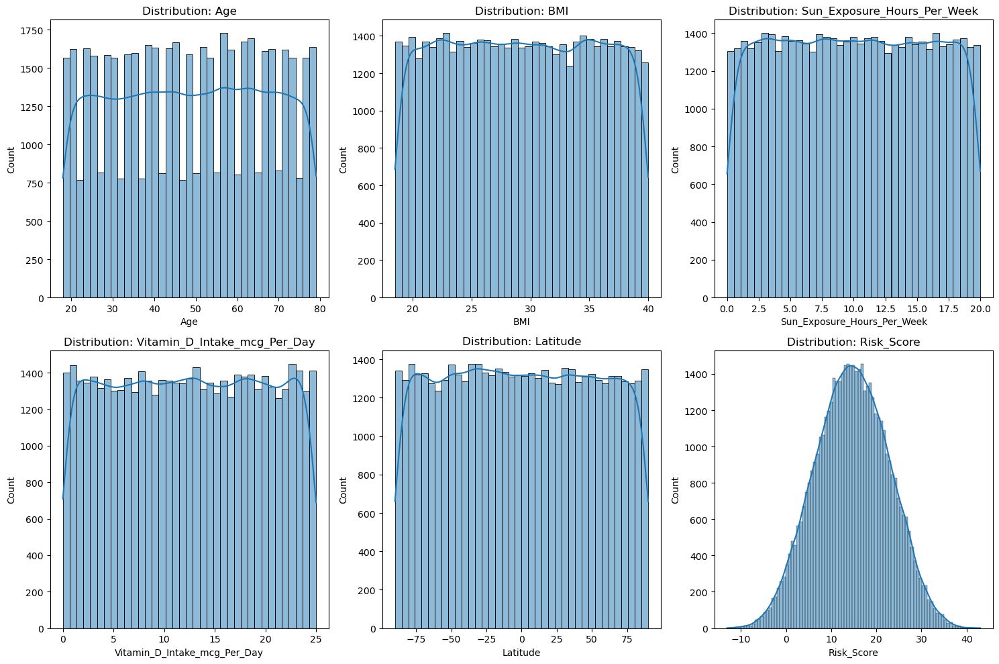

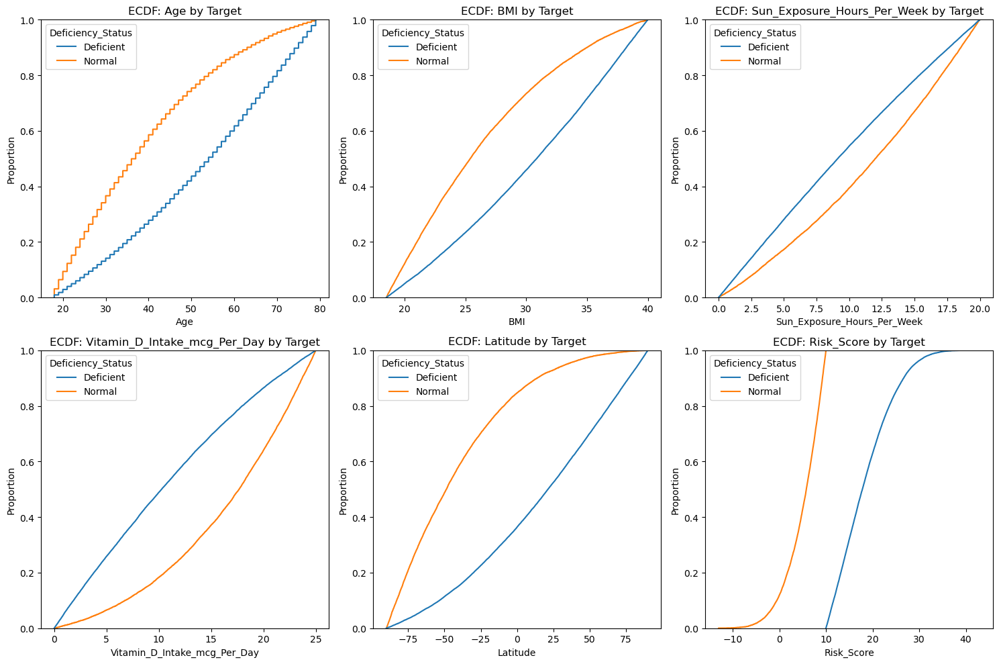

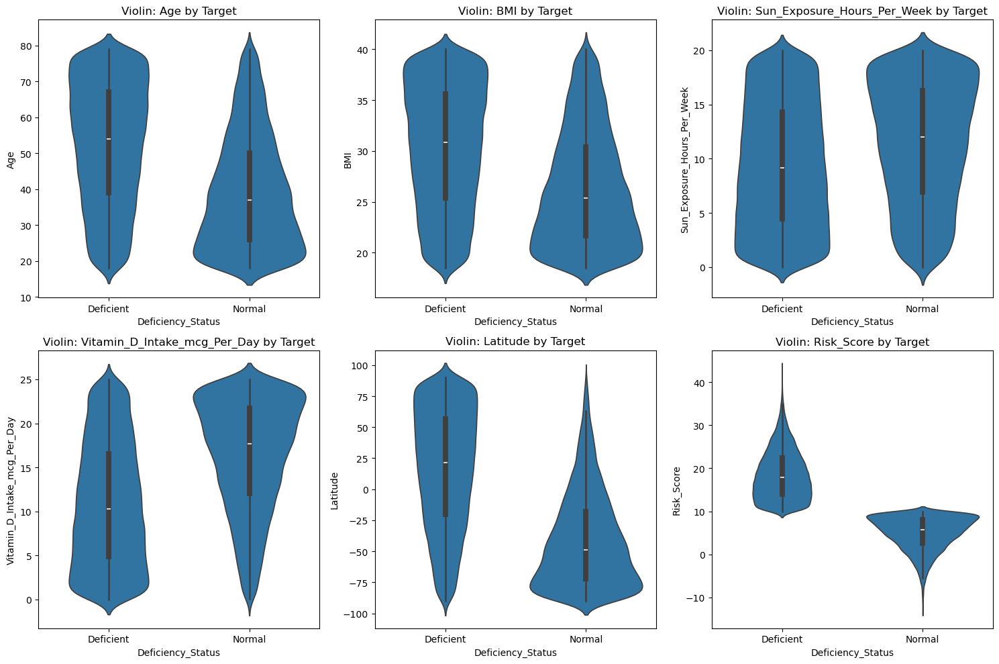

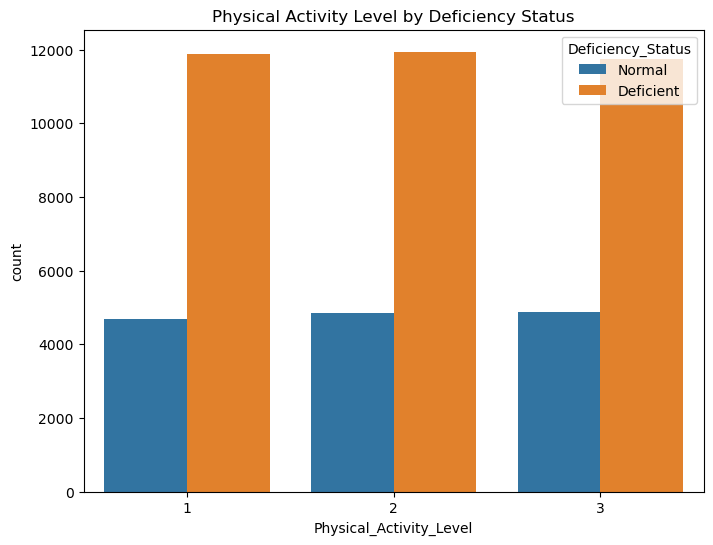

In [18]:
# Histograms for numerical
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols, 1):
    plt.subplot(2, 3, i)
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution: {col}")
plt.tight_layout()
plt.show()

# Additional: ECDF for numerical cumulative distributions
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols, 1):
    plt.subplot(2, 3, i)
    sns.ecdfplot(data=df, x=col, hue='Deficiency_Status')
    plt.title(f"ECDF: {col} by Target")
plt.tight_layout()
plt.show()

# Violin plots: Numerical vs Target
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols, 1):
    plt.subplot(2, 3, i)
    sns.violinplot(x='Deficiency_Status', y=col, data=df)
    plt.title(f"Violin: {col} by Target")
plt.tight_layout()
plt.show()

# Bar plot for categorical (Activity Level)
plt.figure(figsize=(8, 6))
sns.countplot(x='Physical_Activity_Level', hue='Deficiency_Status', data=df)
plt.title("Physical Activity Level by Deficiency Status")
plt.show()

## 11) Feature Interactions
Purpose: Scatter plots for key pairs (e.g., Latitude vs Sun Exposure, as vitamin D relates to geography/sun). Cross-tabs for categorical vs target. Added 3D scatter for triple interactions and heatmap for cross-tab.

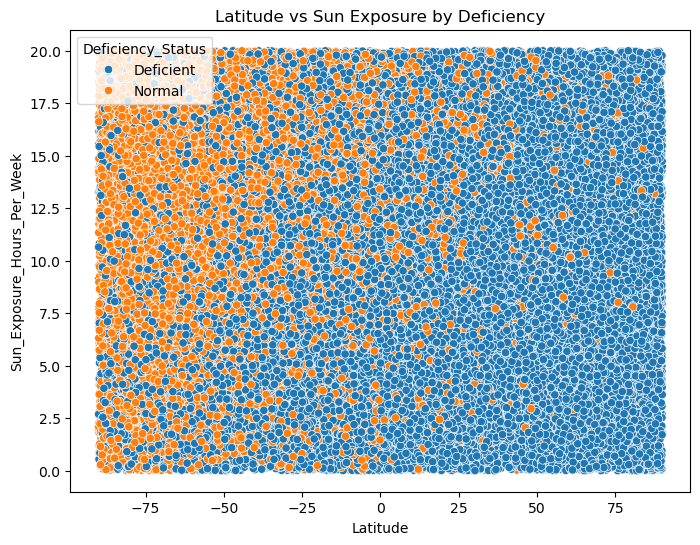

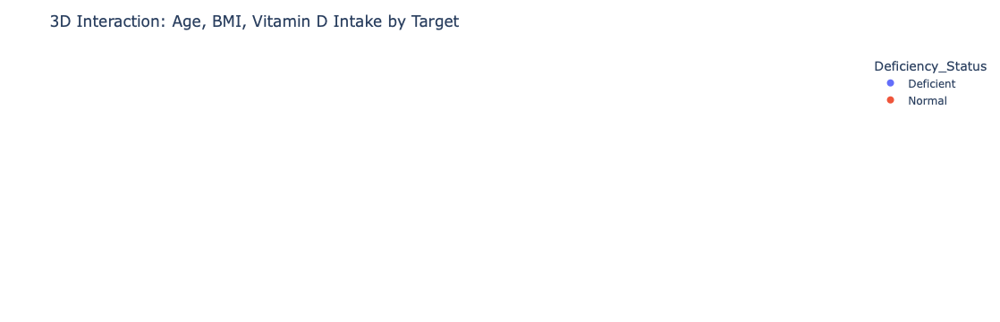


Cross-Tab: Activity Level vs Deficiency:
 Deficiency_Status        Deficient     Normal
Physical_Activity_Level                      
1                        71.685475  28.314525
2                        71.103703  28.896297
3                        70.651194  29.348806


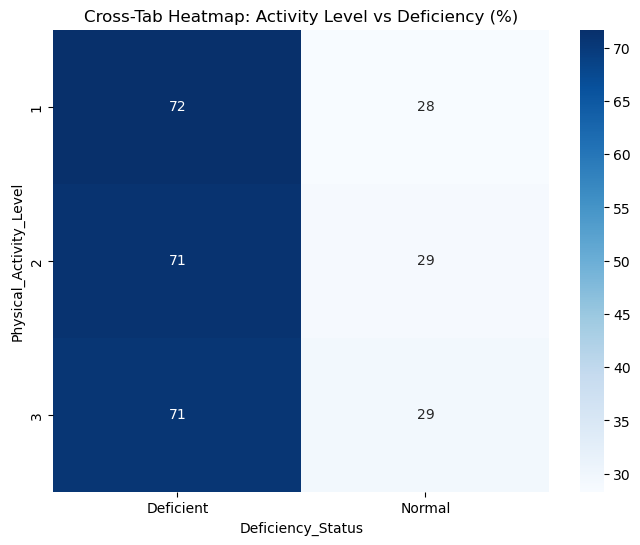

In [19]:
# Scatter plot example: Latitude vs Sun Exposure, colored by target
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Latitude', y='Sun_Exposure_Hours_Per_Week', hue='Deficiency_Status', data=df)
plt.title("Latitude vs Sun Exposure by Deficiency")
plt.show()

# Additional: 3D interactive scatter (e.g., Age, BMI, Vitamin D Intake)
fig = px.scatter_3d(df, x='Age', y='BMI', z='Vitamin_D_Intake_mcg_Per_Day', color='Deficiency_Status')
fig.update_layout(title="3D Interaction: Age, BMI, Vitamin D Intake by Target")
fig.show()

# Cross-tab: Activity Level vs Target
cross_tab = pd.crosstab(df['Physical_Activity_Level'], df['Deficiency_Status'], normalize='index') * 100
print("\nCross-Tab: Activity Level vs Deficiency:\n", cross_tab)

# Visualization: Heatmap for cross-tab
plt.figure(figsize=(8, 6))
sns.heatmap(cross_tab, annot=True, cmap='Blues')
plt.title("Cross-Tab Heatmap: Activity Level vs Deficiency (%)")
plt.show()

## 12) Time/Sequence Analysis (If Applicable)
Purpose: No date columns here, but if there were (e.g., measurement date), check seasonality (vitamin D lower in winter). Skip or note as N/A. For illustration, visualize hypothetical trend if dates existed.

In [20]:

print("No temporal data found. Skipping.")



No temporal data found. Skipping.


## 13) Handle Missing Values (Cleaning Step 1)
Purpose: Impute if any missing (from EDA, likely none). Use median for numerical (robust to outliers), mode for categorical. In healthcare, consider domain: e.g., missing intake = 0 if not supplemented. Visualize before/after missing heatmap.

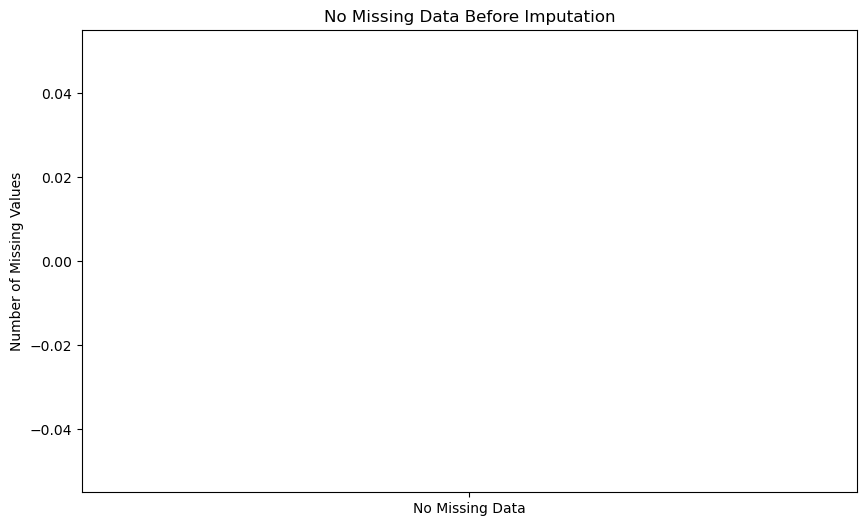

Missing After Imputation: 0


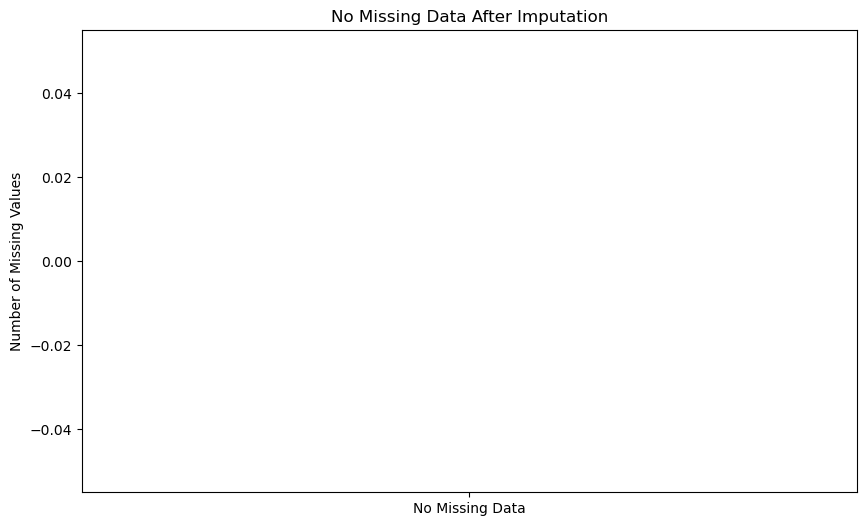

In [ ]:
# Before imputation - bar plot for missing values
missing_counts = df.isnull().sum()
missing_counts = missing_counts[missing_counts > 0]  

plt.figure(figsize=(10, 6))
if len(missing_counts) > 0: 
    missing_counts.sort_values(ascending=False).plot(kind='bar', color='salmon')
    plt.title("Missing Data Count by Feature (Before Imputation)")
    plt.ylabel("Number of Missing Values")
    plt.xlabel("Features")
    plt.xticks(rotation=45)
else:
    plt.bar(["No Missing Data"], [0], color='salmon')
    plt.title("No Missing Data Before Imputation")
    plt.ylabel("Number of Missing Values")
plt.show()

# Numerical imputer
num_imputer = SimpleImputer(strategy='median')
df[num_cols] = num_imputer.fit_transform(df[num_cols])

# Categorical imputer (if any other cats)
cat_imputer = SimpleImputer(strategy='most_frequent')
df[cat_cols[:-1]] = cat_imputer.fit_transform(df[cat_cols[:-1]]) 

print("Missing After Imputation:", df.isnull().sum().sum())

# After imputation - bar plot for missing values
missing_counts_after = df.isnull().sum()
missing_counts_after = missing_counts_after[missing_counts_after > 0]

plt.figure(figsize=(10, 6))
if len(missing_counts_after) > 0:  
    missing_counts_after.sort_values(ascending=False).plot(kind='bar', color='skyblue')
    plt.title("Missing Data Count by Feature (After Imputation)")
    plt.ylabel("Number of Missing Values")
    plt.xlabel("Features")
    plt.xticks(rotation=45)
else:
    plt.bar(["No Missing Data"], [0], color='skyblue')
    plt.title("No Missing Data After Imputation")
    plt.ylabel("Number of Missing Values")
plt.show()

## 14) Handle Outliers (Cleaning Step 2)
Purpose: Cap outliers using IQR (as in original notebook). In healthcare, capping preserves data vs removing (e.g., extreme BMI might be real obesity cases). Visualize before/after boxplots.

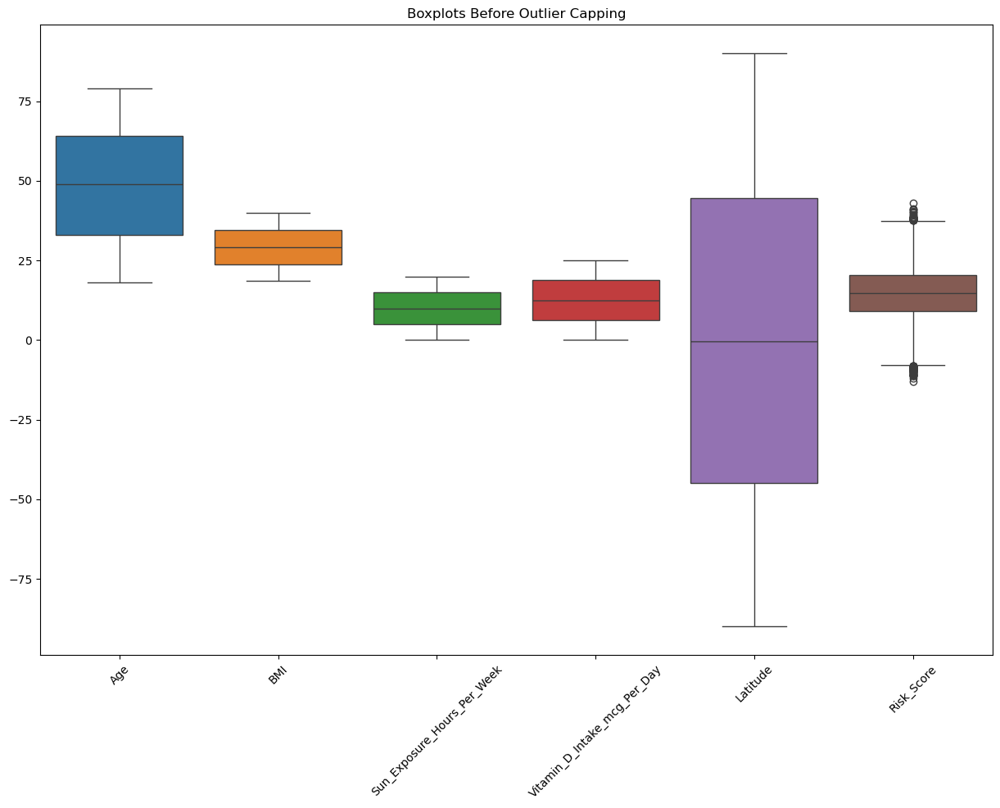

Outliers capped.


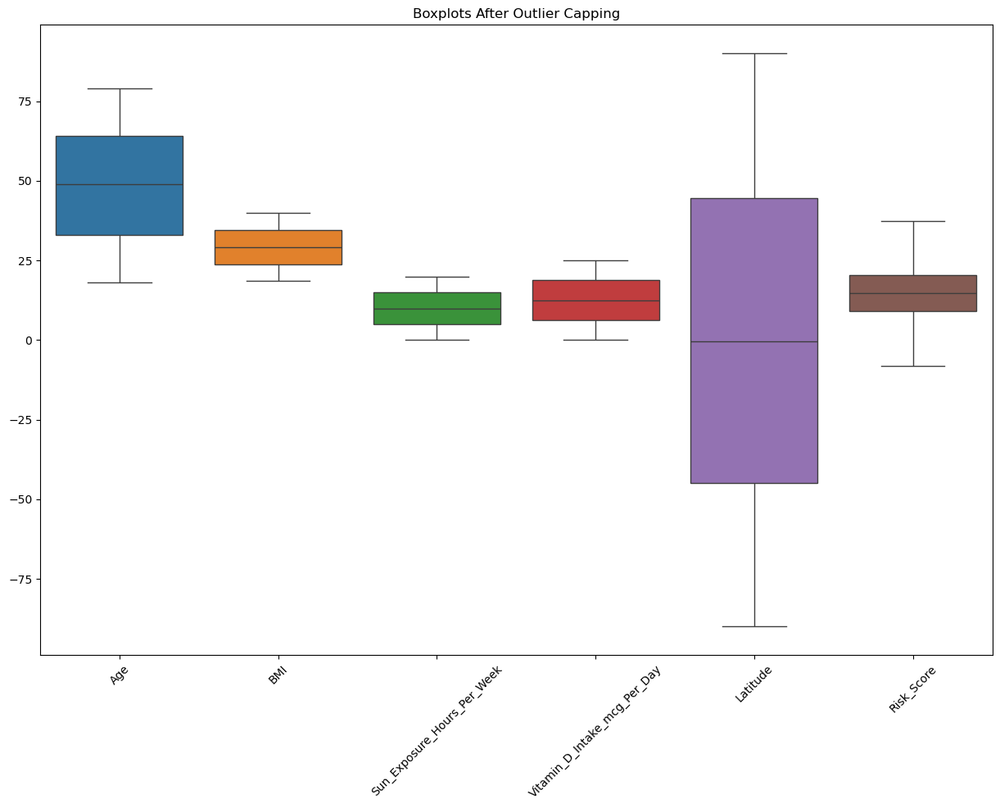

In [27]:
# Before capping boxplots
plt.figure(figsize=(15, 10))
sns.boxplot(data=df[num_cols])
plt.title("Boxplots Before Outlier Capping")
plt.xticks(rotation=45)
plt.show()

def cap_outliers_iqr(df, col):
    Q1, Q3 = df[col].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5*IQR, Q3 + 1.5*IQR
    df[col] = df[col].clip(lower, upper)
    return df

for col in num_cols:
    df = cap_outliers_iqr(df, col)

print("Outliers capped.")

# After capping boxplots
plt.figure(figsize=(15, 10))
sns.boxplot(data=df[num_cols])
plt.title("Boxplots After Outlier Capping")
plt.xticks(rotation=45)
plt.show()

## 15) Standardize Units & Formats (Cleaning Step 3)
Purpose: Ensure consistency. Here, all numerical seem in standard units (e.g., Latitude in degrees, Intake in mcg). Encode target to numeric. Visualize encoded target distribution.

Encoded Target Unique: [0 1]


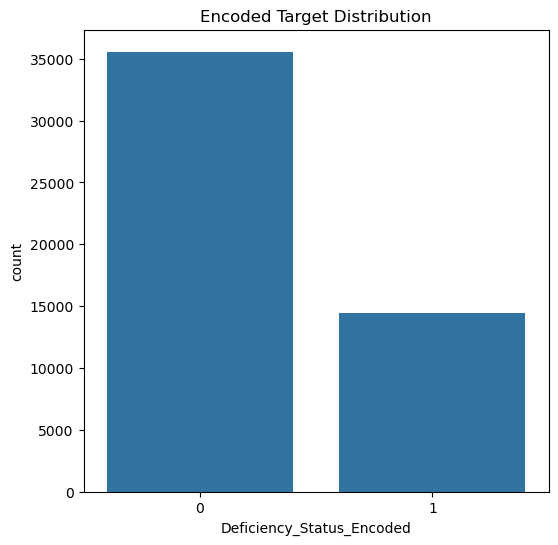

In [28]:
# Encode target: Deficient=1, Normal=0
le = LabelEncoder()
df['Deficiency_Status_Encoded'] = le.fit_transform(df['Deficiency_Status'])
print("Encoded Target Unique:", df['Deficiency_Status_Encoded'].unique())

# Visualization: Bar plot for encoded target
plt.figure(figsize=(6, 6))
sns.countplot(x='Deficiency_Status_Encoded', data=df)
plt.title("Encoded Target Distribution")
plt.show()

## 16) Feature Engineering (Cleaning Step 4, Optional)
Purpose: Create new features if useful (e.g., Absolute Latitude for sun exposure proxy, as vitamin D decreases farther from equator). Bin Age/BMI if needed. Visualize new features' distributions and interactions.

New Feature: Abs_Latitude added.


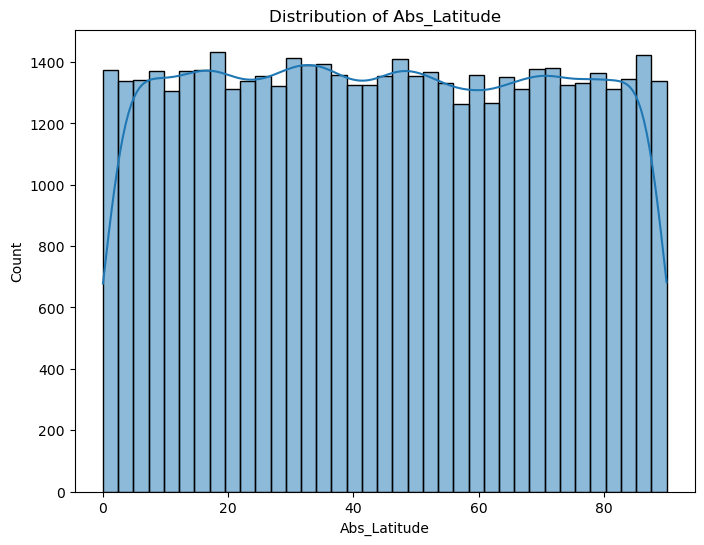


Age Group Distribution:
 Age_Group
Young Adult    13507
Senior         12343
Adult          12142
Elderly        11232
Child            776
Name: count, dtype: int64


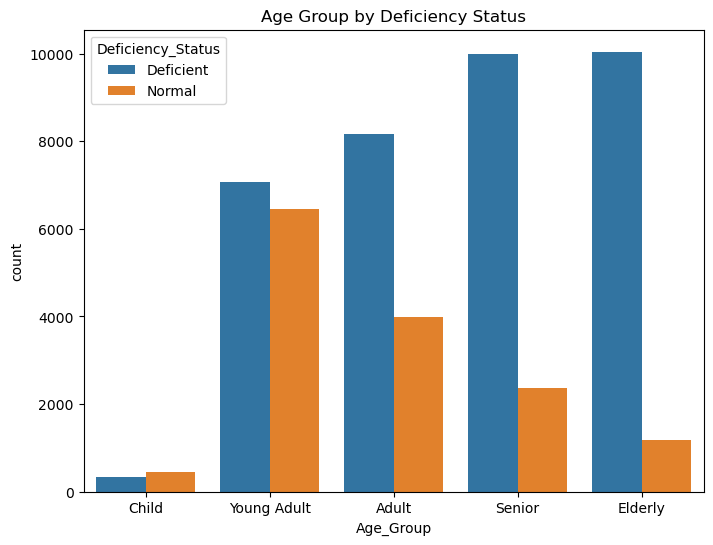

In [ ]:
df['Abs_Latitude'] = abs(df['Latitude'])  
print("New Feature: Abs_Latitude added.")

# Visualization: Histogram for new feature
plt.figure(figsize=(8, 6))
sns.histplot(df['Abs_Latitude'], kde=True)
plt.title("Distribution of Abs_Latitude")
plt.show()

# Example binning: Age groups
df['Age_Group'] = pd.cut(df['Age'], bins=[0, 18, 35, 50, 65, 120], labels=['Child', 'Young Adult', 'Adult', 'Senior', 'Elderly'])
print("\nAge Group Distribution:\n", df['Age_Group'].value_counts())

# Visualization: Bar plot for binned feature
plt.figure(figsize=(8, 6))
sns.countplot(x='Age_Group', data=df, hue='Deficiency_Status')
plt.title("Age Group by Deficiency Status")
plt.show()

## 17) Remove Leakage Features (Cleaning Step 5)
Purpose: Drop Risk_Score (as it's derived/leakage per original notebook). In company, confirm with domain experts if it's post-outcome. Visualize column count before/after.

Columns Before Drop: ['Age', 'BMI', 'Sun_Exposure_Hours_Per_Week', 'Physical_Activity_Level', 'Vitamin_D_Intake_mcg_Per_Day', 'Latitude', 'Risk_Score', 'Deficiency_Status', 'Deficiency_Status_Encoded', 'Abs_Latitude', 'Age_Group']
Leakage features removed.
Columns After Drop: ['Age', 'BMI', 'Sun_Exposure_Hours_Per_Week', 'Physical_Activity_Level', 'Vitamin_D_Intake_mcg_Per_Day', 'Latitude', 'Deficiency_Status', 'Deficiency_Status_Encoded', 'Abs_Latitude', 'Age_Group']


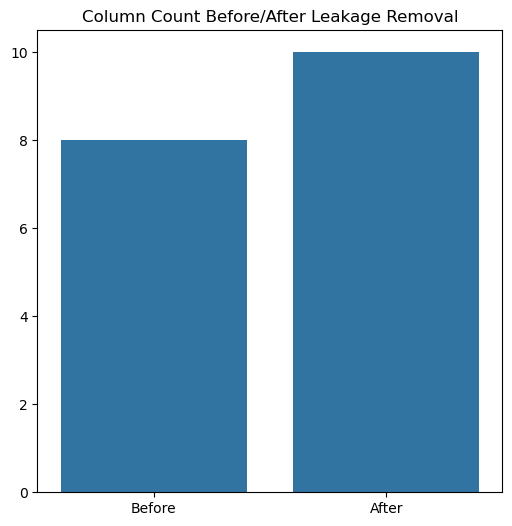

In [30]:
print("Columns Before Drop:", df.columns.tolist())

if 'Risk_Score' in df.columns:
    df.drop('Risk_Score', axis=1, inplace=True)
print("Leakage features removed.")
print("Columns After Drop:", df.columns.tolist())

# Visualization: Bar plot of column counts (simple before/after)
col_counts = {'Before': len(num_cols) + len(cat_cols), 'After': len(df.columns)}
plt.figure(figsize=(6, 6))
sns.barplot(x=list(col_counts.keys()), y=list(col_counts.values()))
plt.title("Column Count Before/After Leakage Removal")
plt.show()

## 18) Normalize/Scale Numerical Features (Cleaning Step 6)
Purpose: Standardize for modeling (mean=0, std=1). Not always needed for EDA, but prep for ML. Skip one-hot for now (no many cats). Visualize before/after distributions.

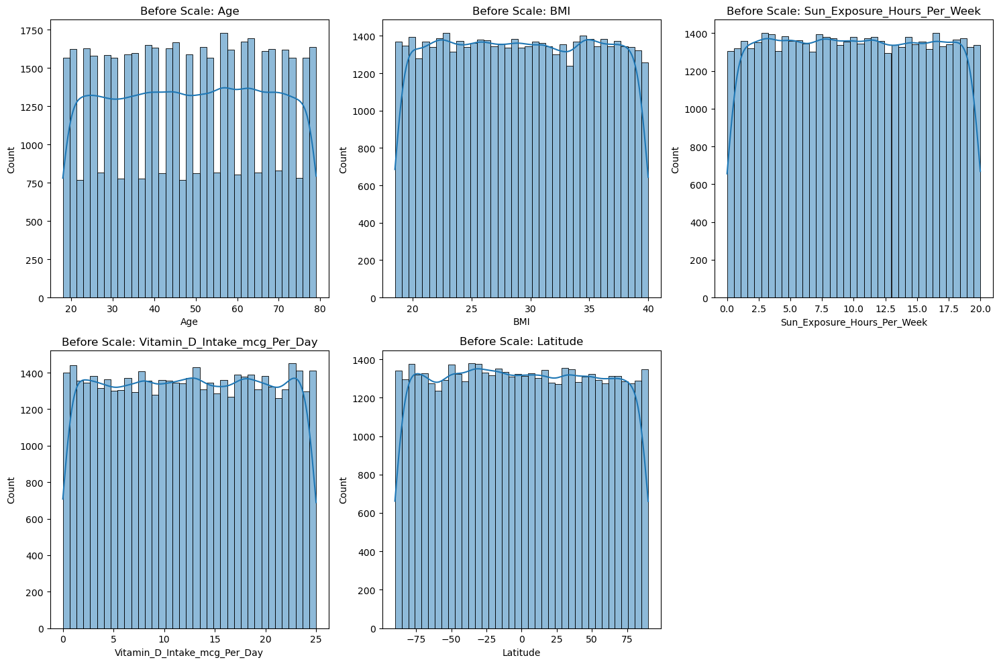

Numerical features scaled.


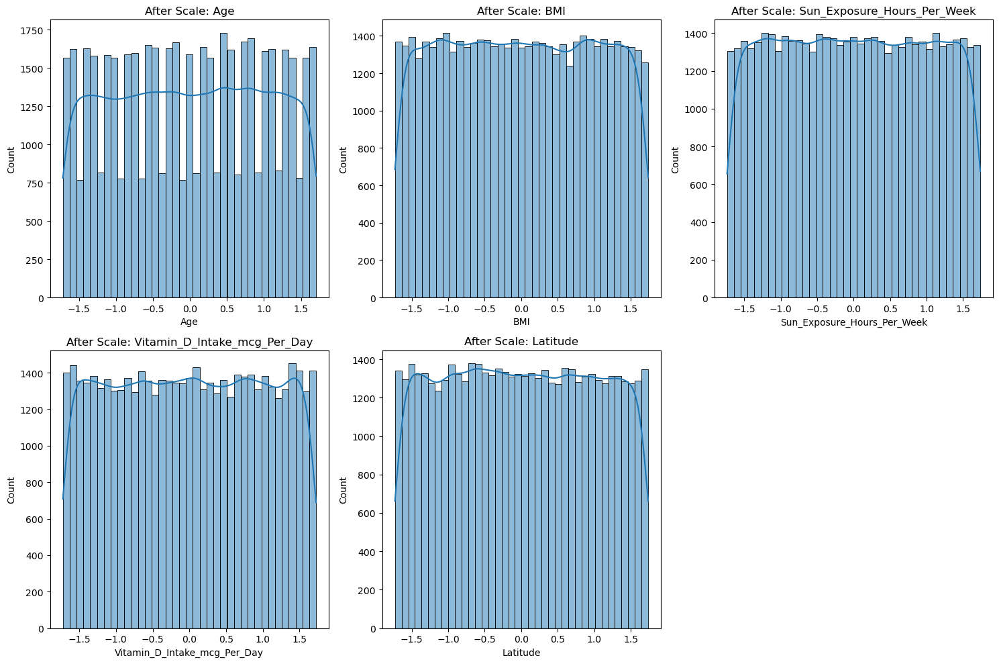

,Age,BMI,Sun_Exposure_Hours_Per_Week,Physical_Activity_Level,Vitamin_D_Intake_mcg_Per_Day,Latitude,Deficiency_Status,Deficiency_Status_Encoded,Abs_Latitude,Age_Group
0,0.862663,0.475420,-0.224905,2,1.153103,1.316887,Deficient,0,68.042439,Senior
1,0.582246,-0.328207,-0.836860,2,-1.605939,0.742649,Deficient,0,38.251049,Senior
2,1.591747,-1.345563,1.305734,3,0.461984,-1.181884,Normal,1,61.593527,Elderly
3,-1.268507,-1.471708,1.293055,1,0.703790,1.177549,Normal,1,60.813603,Young Adult
4,-0.932007,0.328972,1.182860,3,-1.344472,-0.707763,Deficient,0,36.996154,Young Adult


In [ ]:
# Before scaling histograms
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols, 1):
    if col in df.columns:  
        plt.subplot(2, 3, i)
        sns.histplot(df[col], kde=True)
        plt.title(f"Before Scale: {col}")
plt.tight_layout()
plt.show()

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Filter num_cols to only include columns that exist in the DataFrame
valid_num_cols = [col for col in num_cols if col in df.columns]
df[valid_num_cols] = scaler.fit_transform(df[valid_num_cols])
print("Numerical features scaled.")

# After scaling histograms
plt.figure(figsize=(15, 10))
for i, col in enumerate(valid_num_cols, 1):  
    plt.subplot(2, 3, i)
    sns.histplot(df[col], kde=True)
    plt.title(f"After Scale: {col}")
plt.tight_layout()
plt.show()

df.head()

## 19) Final Cleaned Data Check
Purpose: Re-run quick info and save cleaned data. In company, version control this (e.g., save to CSV) and log changes. Visualize final correlation heatmap for cleaned data.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 10 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Age                           50000 non-null  float64 
 1   BMI                           50000 non-null  float64 
 2   Sun_Exposure_Hours_Per_Week   50000 non-null  float64 
 3   Physical_Activity_Level       50000 non-null  int64   
 4   Vitamin_D_Intake_mcg_Per_Day  50000 non-null  float64 
 5   Latitude                      50000 non-null  float64 
 6   Deficiency_Status             50000 non-null  object  
 7   Deficiency_Status_Encoded     50000 non-null  int64   
 8   Abs_Latitude                  50000 non-null  float64 
 9   Age_Group                     50000 non-null  category
dtypes: category(1), float64(6), int64(2), object(1)
memory usage: 3.5+ MB


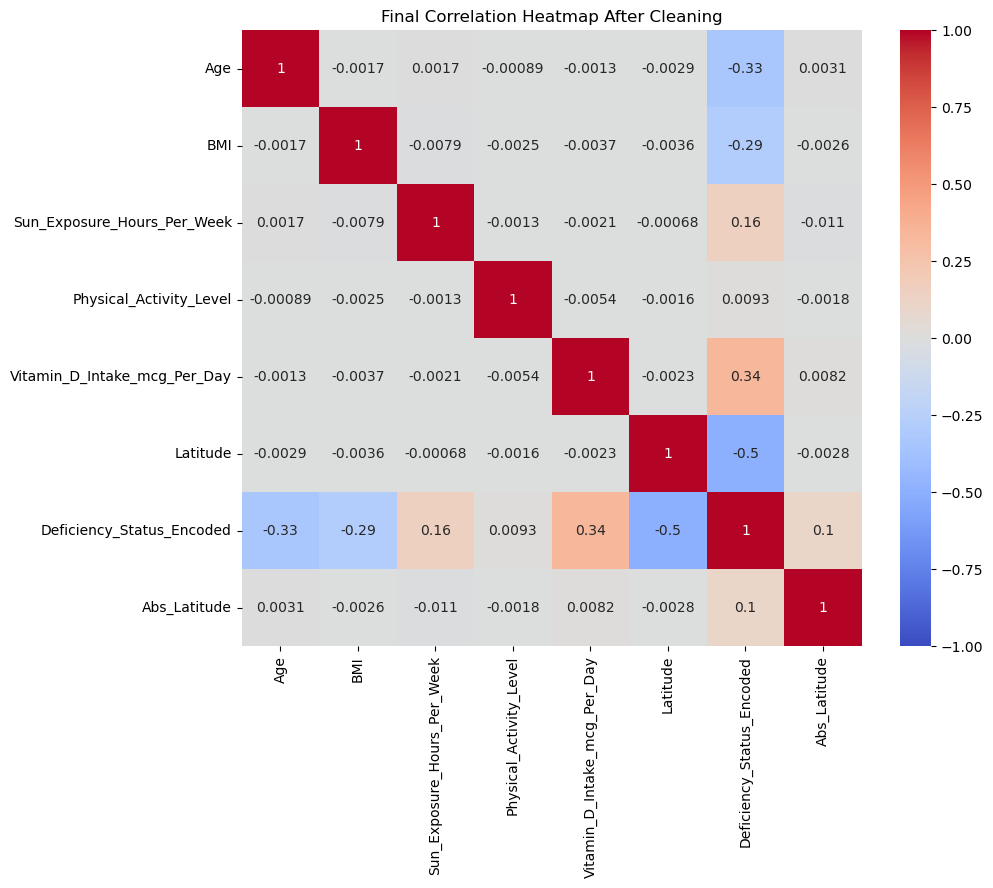

Cleaned data saved. Ready for modeling!


In [33]:
df.info()

# Final visualization: Updated correlation heatmap after cleaning
final_corr = df.select_dtypes(include=['float64', 'int64']).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(final_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Final Correlation Heatmap After Cleaning")
plt.show()

df.to_csv("cleaned_vitamin_d_data.csv", index=False)
print("Cleaned data saved. Ready for modeling!")

## 20) Model Building & Evaluation
 Upon the Cleaned the dataset above saved as "cleaned_vitamin_d_data.csv", utlise the dataset to evaluate the mode.

load the cleaned_vitamin_d_data.csv file as data. 

In [37]:
data=pd.read_csv("cleaned_vitamin_d_data.csv")

### 1. Define Features & Target
We separate the dataset into:

Features (X) → All columns except the target

Target (y) → The column we want to predict (Deficiency_Status)

In [38]:
# Features (X) and Target (y)
X = data.drop(columns=['Deficiency_Status','Deficiency_Status_Encoded','Abs_Latitude','Age_Group'])
y = data['Deficiency_Status_Encoded']

## 2. Train-Test Split
We split the data into:

Training Set → Used to train the model (80%)

Test Set → Used to evaluate performance (20%)

In [39]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

## 3. Train Models
We will train:

Logistic Regression (baseline linear model)

Random Forest Classifier (non-linear, ensemble method)

In [40]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

# Logistic Regression
log_model = LogisticRegression(max_iter=1000)
log_model.fit(X_train, y_train)

# Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

## 4. Predictions & Evaluation
We evaluate both models using:

Accuracy

Classification Report (Precision, Recall, F1-score)

In [41]:
from sklearn.metrics import accuracy_score, classification_report

# Logistic Regression Predictions
y_pred_log = log_model.predict(X_test)
print("=== Logistic Regression ===")
print("Accuracy:", accuracy_score(y_test, y_pred_log))
print(classification_report(y_test, y_pred_log))

# Random Forest Predictions
y_pred_rf = rf_model.predict(X_test)
print("\n=== Random Forest ===")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))


=== Logistic Regression ===
Accuracy: 0.9992
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7115
           1       1.00      1.00      1.00      2885

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000


=== Random Forest ===
Accuracy: 0.972
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      7115
           1       0.97      0.93      0.95      2885

    accuracy                           0.97     10000
   macro avg       0.97      0.96      0.97     10000
weighted avg       0.97      0.97      0.97     10000



## 5. Confusion Matrix Visualization
To understand misclassifications better, we visualize confusion matrices for both models.

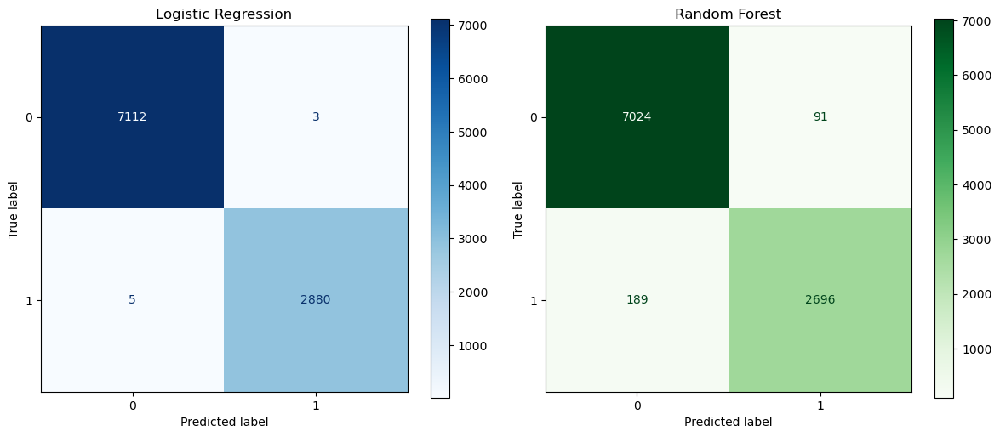

In [42]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

ConfusionMatrixDisplay.from_estimator(log_model, X_test, y_test, ax=axes[0], cmap="Blues")
axes[0].set_title("Logistic Regression")

ConfusionMatrixDisplay.from_estimator(rf_model, X_test, y_test, ax=axes[1], cmap="Greens")
axes[1].set_title("Random Forest")

plt.tight_layout()
plt.show()


## 6. Model Comparison
From the accuracy and classification reports, we can determine which model performs better.

Logistic Regression is simpler, interpretable, and good for linear patterns.

Random Forest handles non-linear relationships, works well with interactions, and gives feature importance.

In [44]:

# Calculate metrics for both models
metrics = {
    "Model": ["Logistic Regression", "Random Forest"],
    "Accuracy": [
        accuracy_score(y_test, y_pred_log),
        accuracy_score(y_test, y_pred_rf)
    ],
    "Precision": [
        precision_score(y_test, y_pred_log, average='weighted'),
        precision_score(y_test, y_pred_rf, average='weighted')
    ],
    "Recall": [
        recall_score(y_test, y_pred_log, average='weighted'),
        recall_score(y_test, y_pred_rf, average='weighted')
    ],
    "F1 Score": [
        f1_score(y_test, y_pred_log, average='weighted'),
        f1_score(y_test, y_pred_rf, average='weighted')
    ]
}

# Create DataFrame for comparison
comparison_df = pd.DataFrame(metrics)

print("\n=== Model Comparison ===")
print(comparison_df)



=== Model Comparison ===
                 Model  Accuracy  Precision  Recall  F1 Score
0  Logistic Regression    0.9992   0.999200  0.9992  0.999200
1        Random Forest    0.9720   0.971937  0.9720  0.971854


## 21) Model Optimization & ROC Curve Comparison

### 1. Hyperparameter Tuning
We’ll tune:

Logistic Regression: C (regularization strength)

Random Forest: n_estimators, max_depth, and min_samples_split

In [46]:
from sklearn.model_selection import GridSearchCV

# Logistic Regression Tuning
log_params = {
    'C': [0.01, 0.1, 1, 10, 100]
}
log_grid = GridSearchCV(LogisticRegression(max_iter=1000), log_params, cv=5, scoring='accuracy')
log_grid.fit(X_train, y_train)
best_log_model = log_grid.best_estimator_
print("Best Logistic Regression Params:", log_grid.best_params_)

# Random Forest Tuning
rf_params = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10]
}
rf_grid = GridSearchCV(RandomForestClassifier(random_state=42), rf_params, cv=5, scoring='accuracy', n_jobs=-1)
rf_grid.fit(X_train, y_train)
best_rf_model = rf_grid.best_estimator_
print("Best Random Forest Params:", rf_grid.best_params_)


Best Logistic Regression Params: {'C': 100}
Best Random Forest Params: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 200}


### 2. ROC Curve Comparison
We’ll compare the ROC curves for both tuned models.

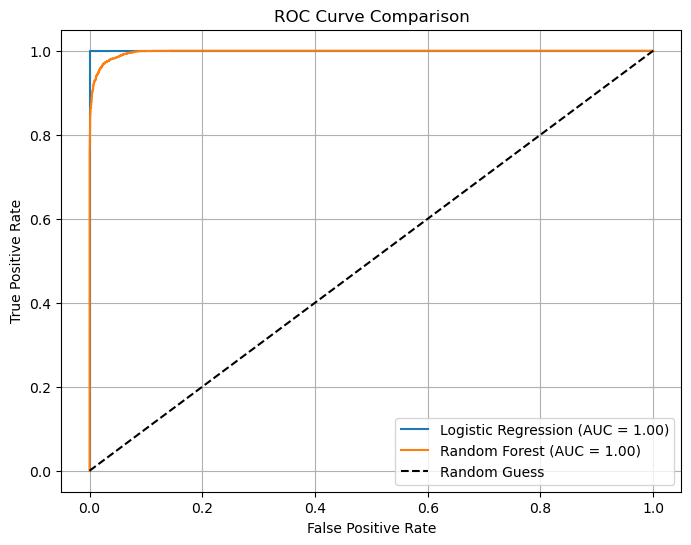

In [50]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Get predicted probabilities
y_prob_log = best_log_model.predict_proba(X_test)[:, 1]
y_prob_rf = best_rf_model.predict_proba(X_test)[:, 1]

# ROC values
fpr_log, tpr_log, _ = roc_curve(y_test, y_prob_log, pos_label=y.unique()[1])
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_prob_rf, pos_label=y.unique()[1])

roc_auc_log = auc(fpr_log, tpr_log)
roc_auc_rf = auc(fpr_rf, tpr_rf)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr_log, tpr_log, label=f"Logistic Regression (AUC = {roc_auc_log:.2f})")
plt.plot(fpr_rf, tpr_rf, label=f"Random Forest (AUC = {roc_auc_rf:.2f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison")
plt.legend()
plt.grid(True)
plt.show()


## 3. Final Model Selection
Pick the model with:

Higher AUC score

Balanced precision and recall

Good performance on test set (no overfitting)

In [48]:
from sklearn.metrics import roc_auc_score, precision_score, recall_score

# Calculate AUC for both models
auc_log = roc_auc_score(y_test, y_prob_log)
auc_rf = roc_auc_score(y_test, y_prob_rf)

# Calculate Precision & Recall for both models
precision_log = precision_score(y_test, y_pred_log, average='weighted')
recall_log = recall_score(y_test, y_pred_log, average='weighted')

precision_rf = precision_score(y_test, y_pred_rf, average='weighted')
recall_rf = recall_score(y_test, y_pred_rf, average='weighted')

# Create a dictionary for comparison
model_scores = {
    "Logistic Regression": {
        "AUC": auc_log,
        "Precision": precision_log,
        "Recall": recall_log
    },
    "Random Forest": {
        "AUC": auc_rf,
        "Precision": precision_rf,
        "Recall": recall_rf
    }
}

# Decide based on highest AUC first, then balanced precision-recall
best_model_name = max(model_scores, key=lambda m: (
    model_scores[m]["AUC"], 
    -abs(model_scores[m]["Precision"] - model_scores[m]["Recall"])
))

print("\n=== Final Model Selection ===")
print(f"Selected Model: {best_model_name}")
print("Scores:", model_scores[best_model_name])



=== Final Model Selection ===
Selected Model: Logistic Regression
Scores: {'AUC': 0.9999992692471175, 'Precision': 0.9991999323920959, 'Recall': 0.9992}
